# Zomato Bangalore Restaurants

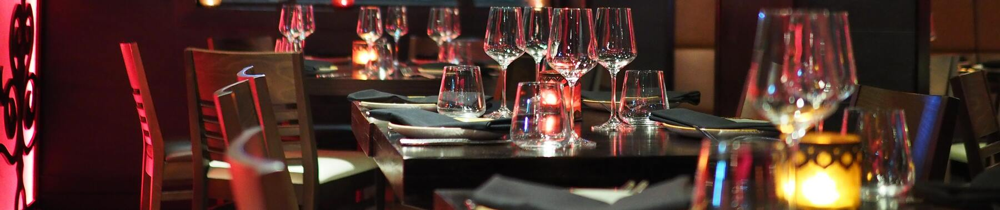

# :::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::
# Target:
# create a classification model to determine if the restaurant is good or not based on the rated column
# :::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::::

In [1]:
# Import necessary libraries

# Data manipulation and analysis
import pandas as pd  # Powerful library for data analysis and manipulation

# Interactive data visualization
import plotly_express as px  # High-level library for creating interactive visualizations
import plotly.graph_objects as go  # Lower-level library for more control over visualizations

# Numerical operations
import numpy as np  # Essential library for numerical computations and array operations

# Warning control
import warnings  # To manage and suppress warnings during code execution

# Statistical data visualization
import seaborn as sns  # Library for creating informative and aesthetic statistical graphics

# Static data visualization
import matplotlib.pyplot as plt  # Foundational library for creating static plots
plt.style.use('ggplot')  # Set a visually appealing style for plots

# Model persistence
import joblib  # Library for saving and loading machine learning models

# Outlier detection
from datasist.structdata import detect_outliers  # Function for identifying potential outliers

# Suppress warnings
warnings.filterwarnings('ignore')  # Prevent warnings from being displayed, potentially improving readability

In [2]:
# Read the 'american_bankruptcy.csv' file into a pandas DataFrame and store it in the variable 'df'
df = pd.read_csv('zomato.csv')

# Display the DataFrame to view its contents
df

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51712,https://www.zomato.com/bangalore/best-brews-fo...,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6 /5,27,080 40301477,Whitefield,Bar,NaN,Continental,"1,500","[('Rated 5.0', ""RATED\n Food and service are ...",[],Pubs and bars,Whitefield
51713,https://www.zomato.com/bangalore/vinod-bar-and...,"Number 10, Garudachar Palya, Mahadevapura, Whi...",Vinod Bar And Restaurant,No,No,NaN,0,+91 8197675843,Whitefield,Bar,NaN,Finger Food,600,[],[],Pubs and bars,Whitefield
51714,https://www.zomato.com/bangalore/plunge-sherat...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,NaN,0,NaN,Whitefield,Bar,NaN,Finger Food,"2,000",[],[],Pubs and bars,Whitefield
51715,https://www.zomato.com/bangalore/chime-sherato...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3 /5,236,080 49652769,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,"2,500","[('Rated 4.0', 'RATED\n Nice and friendly pla...",[],Pubs and bars,Whitefield


 # Columns Description

#### url - contains the url of the restaurant in the zomato website
#### address - contains the address of the restaurant in Bengaluru
#### name - contains the name of the restaurant
#### online_order - whether online ordering is available in the restaurant or not
#### book_table - table book option available or not
#### rate contains - the overall rating of the restaurant out of 5
#### votes - contains total number of rating for the restaurant as of the above mentioned date
#### phone - contains the phone number of the restaurant
#### location - contains the neighborhood in which the restaurant is located
#### rest_type - restaurant type
#### dish_liked - dishes people liked in the restaurant
#### cuisines - food styles, separated by comma
#### approx_cost(for two people) - contains the approximate cost for meal for two people
#### reviews_list - list of tuples containing reviews for the restaurant, each tuple
#### menu_item - contains list of menus available in the restaurant
#### listed_in(type) - type of meal
#### listed_in(city) - contains the neighborhood in which the restaurant is listed

In [3]:
# This function is designed to address the issue of wide data with 17 columns, where it becomes difficult
# to view all the values properly. By creating this function, we aim to display all values of all columns,
# making the data analysis process more convenient and accessible.

def show_df(x):
    
    """
    Display specific columns from the DataFrame 'df' to showcase a subset of data.

    Args:
        df (pandas.DataFrame): The input DataFrame.

    Returns:
        None
    """
    
    # Create separate DataFrames with selected columns for display
    df1 = x[['url', 'address', 'name', 'online_order']].head(3)
    df2 = x[['book_table', 'rate', 'votes', 'phone']].head(3)
    df3 = x[['location', 'rest_type', 'dish_liked','cuisines','listed_in(type)']].head(3)
    df4 = x[['approx_cost(for two people)', 'reviews_list', 'menu_item','listed_in(city)']].head(3)
    
    
    # Display the separate DataFrames
    display(df1)
    display(df2)
    display(df3)
    display(df4)
    
    
# Show DataFrame 'df'
show_df(df)

,url,address,name,online_order
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes


,book_table,rate,votes,phone
0,Yes,4.1/5,775,080 42297555\r\n+91 9743772233
1,No,4.1/5,787,080 41714161
2,No,3.8/5,918,+91 9663487993


,location,rest_type,dish_liked,cuisines,listed_in(type)
0,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",Buffet
1,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",Buffet
2,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",Buffet


,approx_cost(for two people),reviews_list,menu_item,listed_in(city)
0,800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Banashankari
1,800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Banashankari
2,800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Banashankari


In [4]:
# This function 'summary' takes a DataFrame 'df' as input and generates a summary report for the data.
# It calculates and displays information such as the shape of the DataFrame, data types, missing values,
# unique values, basic descriptive statistics (min, max, mean), and the first three values of the dataset.
# The summary is returned as a DataFrame.

def summary(df):
    # Display the shape of the DataFrame
    print(f'data shape: {df.shape}')

    # Create a summary DataFrame with data types
    summ = pd.DataFrame(df.dtypes, columns=['data type'])

    # Calculate and add the number of missing values
    summ['#missing'] = df.isnull().sum().values

    # Calculate and add the percentage of missing values
    summ['%missing'] = df.isnull().sum().values / len(df) * 100

    # Calculate and add the number of unique values
    summ['#unique'] = df.nunique().values

    # Create a DataFrame with basic descriptive statistics
    desc = pd.DataFrame(df.describe(include='all').transpose())

    # Add minimum, maximum, mean, and the first three values to the summary DataFrame
    summ['min'] = desc['min'].values
    summ['max'] = desc['max'].values
    summ['mean'] = desc['mean'].values
    summ['first value'] = df.loc[0].values
    summ['second value'] = df.loc[1].values

    # Return the summary DataFrame
    return summ

# To use this function and generate a summary of your DataFrame 'df', you can call it like this:
summary(df)


data shape: (51717, 17)


,data type,#missing,%missing,#unique,min,max,mean,first value,second value
url,object,0,0.000000,51717,NaN,NaN,NaN,https://www.zomato.com/bangalore/jalsa-banasha...,https://www.zomato.com/bangalore/spice-elephan...
address,object,0,0.000000,11495,NaN,NaN,NaN,"942, 21st Main Road, 2nd Stage, Banashankari, ...","2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ..."
name,object,0,0.000000,8792,NaN,NaN,NaN,Jalsa,Spice Elephant
online_order,object,0,0.000000,2,NaN,NaN,NaN,Yes,Yes
book_table,object,0,0.000000,2,NaN,NaN,NaN,Yes,No
rate,object,7775,15.033741,64,NaN,NaN,NaN,4.1/5,4.1/5
votes,int64,0,0.000000,2328,0.0,16832.0,283.697527,775,787
phone,object,1208,2.335789,14926,NaN,NaN,NaN,080 42297555\r\n+91 9743772233,080 41714161
location,object,21,0.040606,93,NaN,NaN,NaN,Banashankari,Banashankari
rest_type,object,227,0.438927,93,NaN,NaN,NaN,Casual Dining,Casual Dining


In [5]:
# Check Duplicated
df.duplicated().sum()

0

In [6]:
show_df(df)

,url,address,name,online_order
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes


,book_table,rate,votes,phone
0,Yes,4.1/5,775,080 42297555\r\n+91 9743772233
1,No,4.1/5,787,080 41714161
2,No,3.8/5,918,+91 9663487993


,location,rest_type,dish_liked,cuisines,listed_in(type)
0,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",Buffet
1,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",Buffet
2,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",Buffet


,approx_cost(for two people),reviews_list,menu_item,listed_in(city)
0,800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Banashankari
1,800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Banashankari
2,800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Banashankari


In [7]:
df.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines',
       'approx_cost(for two people)', 'reviews_list', 'menu_item',
       'listed_in(type)', 'listed_in(city)'],
      dtype='object')

# Columns Handling


# url

In [8]:
#Retrieve the unique values of the
df['url'].unique()

array(['https://www.zomato.com/bangalore/jalsa-banashankari?context=eyJzZSI6eyJlIjpbNTg2OTQsIjE4Mzc1NDc0IiwiNTkwOTAiLCIxODM4Mjk0NCIsIjE4MjI0Njc2IiwiNTkyODkiLCIxODM3MzM4NiJdLCJ0IjoiUmVzdGF1cmFudHMgaW4gQmFuYXNoYW5rYXJpIHNlcnZpbmcgQnVmZmV0In19',
       'https://www.zomato.com/bangalore/spice-elephant-banashankari?context=eyJzZSI6eyJlIjpbIjU4Njk0IiwxODM3NTQ3NCwiNTkwOTAiLCIxODM4Mjk0NCIsIjE4MjI0Njc2IiwiNTkyODkiLCIxODM3MzM4NiJdLCJ0IjoiUmVzdGF1cmFudHMgaW4gQmFuYXNoYW5rYXJpIHNlcnZpbmcgQnVmZmV0In19',
       'https://www.zomato.com/SanchurroBangalore?context=eyJzZSI6eyJlIjpbIjU4Njk0IiwiMTgzNzU0NzQiLDU5MDkwLCIxODM4Mjk0NCIsIjE4MjI0Njc2IiwiNTkyODkiLCIxODM3MzM4NiJdLCJ0IjoiUmVzdGF1cmFudHMgaW4gQmFuYXNoYW5rYXJpIHNlcnZpbmcgQnVmZmV0In19',
       ...,
       'https://www.zomato.com/bangalore/plunge-sheraton-grand-bengaluru-whitefield-hotel-convention-centre-whitefield-bangalore?context=eyJzZSI6eyJlIjpbIjE4NjAyNDc4IiwiMTgyOTAwNTIiLCI1ODM1NCIsIjE4NzQxMTI5IiwxODY2MTA0MCwiMTg2NjEwODQiLCIxODY5MDgzNyJdLCJ0IjoiUHV

# address

In [9]:
# Retrieve the unique values of the
df['address'].unique()

array(['942, 21st Main Road, 2nd Stage, Banashankari, Bangalore',
       '2nd Floor, 80 Feet Road, Near Big Bazaar, 6th Block, Kathriguppe, 3rd Stage, Banashankari, Bangalore',
       '1112, Next to KIMS Medical College, 17th Cross, 2nd Stage, Banashankari, Bangalore',
       ...,
       'Cessna Business Park, Sarjapur Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x96 Marathahalli Outer Ring Road, Kadubeesanahalli, Bellandur Post, Bengaluru, Karnataka',
       '44, Kodigehalli to Hoodi Main Road, Mahadevapura Post, KR Puram, Bangalore',
       '139/C1, Next To GR Tech Park, Pattandur Agrahara, ITPL, Main Road, Whitefield, Bangalore'],
      dtype=object)

# Name

In [10]:
# Extracts unique values from the 'name' column in the Pandas DataFrame df and converts them to a Python list.
df['name'].unique().tolist()

['Jalsa',
 'Spice Elephant',
 'San Churro Cafe',
 'Addhuri Udupi Bhojana',
 'Grand Village',
 'Timepass Dinner',
 'Rosewood International Hotel - Bar & Restaurant',
 'Onesta',
 'Penthouse Cafe',
 'Smacznego',
 'CafÃ\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â© Down The Alley',
 'Cafe Shuffle',
 'The Coffee Shack',
 'Caf-Eleven',
 'Cafe Vivacity',
 'Catch-up-ino',
 "Kirthi's Biryani",
 'T3H Cafe',
 '360 Atoms Restaurant And Cafe',
 'The Vintage Cafe',
 'Woodee Pizza',
 'Cafe Coffee Day',
 'My Tea House',
 'Hide Out Cafe',
 'CAFE NOVA',
 'Coffee Tindi',
 'Sea Green Cafe',
 'Cuppa',
 "Srinathji's Cafe",
 'Redberrys',
 'Foodiction',
 'Sweet Truth',
 'Ovenstory Pizza',
 'Faasos',
 'Behrouz Biryani',
 'Fast And Fresh',
 'Szechuan Dragon',
 'Empire Restaurant',
 'Maruthi Davangere Benne Dosa',
 'Chaatimes',
 'Havyaka Mess',
 "McDonald's",
 "Domino's Pizza",
 'Hotboxit',
 'Kitchen Garden',
 'Recipe',
 'Beijing Bites',
 'Tasty Bytes',
 'Petoo',
 'Shree Cool Point'

In [11]:
# Retrieves the top 20 most frequent occurrences of values in the 'name' column of the Pandas DataFrame df.
df['name'].value_counts()[:20]

Cafe Coffee Day      96
Onesta               85
Just Bake            73
Empire Restaurant    71
Five Star Chicken    70
Kanti Sweets         68
Petoo                66
Polar Bear           65
Baskin Robbins       64
Chef Baker's         62
Pizza Hut            62
Domino's Pizza       60
KFC                  60
Sweet Truth          60
Subway               60
Beijing Bites        60
Smoor                59
McDonald's           59
Chai Point           58
Faasos               57
Name: name, dtype: int64

In [12]:
# Counts the occurrences of each unique value in the 'name' column of the Pandas DataFrame df,
# selects the top 20 most frequent values, resets the index, and renames columns to 'name' and 'count'.
top_20_restaurants = df['name'].value_counts(ascending=False)[:20].reset_index()
top_20_restaurants.columns = ['name', 'count']
top_20_restaurants


,name,count
0,Cafe Coffee Day,96
1,Onesta,85
2,Just Bake,73
3,Empire Restaurant,71
4,Five Star Chicken,70
5,Kanti Sweets,68
6,Petoo,66
7,Polar Bear,65
8,Baskin Robbins,64
9,Chef Baker's,62


In [13]:
# Creates a horizontal bar plot using Plotly Express (px) with data from the top_20_restaurants DataFrame.
px.bar(top_20_restaurants, y='name', x='count', orientation='h',
       text_auto=True,
       title='Top 20 Restaurants in Bangalore by Zomato',
       labels={'name': 'Restaurant Name', 'count': 'Count'},
       template='plotly_dark',  # Choose a template from available options
       color_discrete_sequence=px.colors.qualitative.Set2)


# online_order

In [14]:
# Counts the occurrences of each unique value in the 'online_order' column of the Pandas DataFrame df.
df['online_order'].value_counts()


Yes    30444
No     21273
Name: online_order, dtype: int64

In [15]:
# Creates a histogram using Plotly Express (px) to visualize the distribution of 'online_order' values in the DataFrame df.
px.histogram(data_frame=df, x='online_order', text_auto=True,
             template='plotly_dark', color_discrete_sequence=px.colors.qualitative.Set3)


In [16]:
# Counts the occurrences of each unique value in the 'online_order' column of the Pandas DataFrame df.
x = df['online_order'].value_counts()

# Retrieves the unique values (labels) from the 'online_order' column.
labels = df['online_order'].value_counts().index

# 'x' contains the counts of each unique value, and 'labels' contains the corresponding unique values.
x


Yes    30444
No     21273
Name: online_order, dtype: int64

In [17]:
# Creates a pie chart using Plotly Express (px) to visualize the distribution of 'online_order' values in the DataFrame df.
px.pie(df, names=labels, title='Online Order Distribution', labels=labels, values=x,
       template='plotly_dark', color_discrete_sequence=px.colors.qualitative.Set3)


In [18]:
df.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines',
       'approx_cost(for two people)', 'reviews_list', 'menu_item',
       'listed_in(type)', 'listed_in(city)'],
      dtype='object')

# book_table

In [19]:
# Counts the occurrences of each unique value in the 'book_table' column of the Pandas DataFrame df.
df['book_table'].value_counts()

No     45268
Yes     6449
Name: book_table, dtype: int64

In [20]:
# Creates a histogram using Plotly Express (px) to visualize the distribution of 'book_table' values in the DataFrame df.
px.histogram(data_frame=df, x='book_table', text_auto=True,
             template='plotly_dark', color_discrete_sequence=px.colors.qualitative.Set3)


In [21]:
# Counts the occurrences of each unique value in the 'online_order' column of the Pandas DataFrame df.
x = df['book_table'].value_counts()

# Retrieves the unique values (labels) from the 'online_order' column.
labels = df['book_table'].value_counts().index

# 'x' contains the counts of each unique value, and 'labels' contains the corresponding unique values.
x


No     45268
Yes     6449
Name: book_table, dtype: int64

In [22]:
# Creates a pie chart using Plotly Express (px) to visualize the distribution of 'online_order' values in the DataFrame df.
px.pie(df, names=labels, title='Book table Distribution', labels=labels, values=x,
       template='plotly_dark', color_discrete_sequence=px.colors.qualitative.Set3)


## Rate

In [23]:
# Retrieves the unique values in the 'rate' column of the Pandas DataFrame df.
df['rate'].unique()


array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [24]:
# Counts the occurrences of each unique value in the 'rate' column of the Pandas DataFrame df.
df['rate'].value_counts()


NEW       2208
3.9/5     2098
3.8/5     2022
3.7/5     2011
3.9 /5    1874
          ... 
2.2 /5       7
2.0 /5       7
2.0/5        4
1.8 /5       3
1.8/5        2
Name: rate, Length: 64, dtype: int64

In [25]:
def fix_rate(x):
    """
    Function to process and fix values in the 'rate' column.
    - Replaces 'NEW' with '0'.
    - Replaces '-' with '0'.
    - Extracts the numeric part before '/' in case of a rating range.
    Returns NaN if the input is NaN.

    Parameters:
    - x: Input value from the 'rate' column.

    Usage example:
    df['rate'] = df['rate'].apply(fix_rate)
    """
    if pd.notna(x):
        if 'NEW' in x:
            return x.replace('NEW', '0')
        elif '-' in x:
            return x.replace('-', '0')
        elif '/' in x:
            return x.split('/')[0]
    else:
        return np.nan

In [26]:
# Applies the fix_rate function to the 'rate' column of the Pandas DataFrame df.
df['rate'] = df['rate'].apply(fix_rate)


In [27]:
# Retrieves the unique values in the 'rate' column of the Pandas DataFrame df after applying the fix_rate function.
df['rate'].unique()


array(['4.1', '3.8', '3.7', '3.6', '4.6', '4.0', '4.2', '3.9', '3.1',
       '3.0', '3.2', '3.3', '2.8', '4.4', '4.3', '0', '2.9', '3.5', nan,
       '2.6', '3.8 ', '3.4', '4.5', '2.5', '2.7', '4.7', '2.4', '2.2',
       '2.3', '3.4 ', '3.6 ', '4.8', '3.9 ', '4.2 ', '4.0 ', '4.1 ',
       '3.7 ', '3.1 ', '2.9 ', '3.3 ', '2.8 ', '3.5 ', '2.7 ', '2.5 ',
       '3.2 ', '2.6 ', '4.5 ', '4.3 ', '4.4 ', '4.9', '2.1', '2.0', '1.8',
       '4.6 ', '4.9 ', '3.0 ', '4.8 ', '2.3 ', '4.7 ', '2.4 ', '2.1 ',
       '2.2 ', '2.0 ', '1.8 '], dtype=object)

In [28]:
# Converts the 'rate' column in the Pandas DataFrame df to numeric values, coercing errors to NaN and downcasting to float.
df['rate'] = pd.to_numeric(df['rate'], errors='coerce', downcast='float')


In [29]:
# Counts the number of NaN (missing) values in the 'rate' column of the Pandas DataFrame df.
df['rate'].isna().sum()


7775

In [30]:
# Creates a histogram using Plotly Express (px) to visualize the distribution of values in the 'rate' column of the DataFrame df.
# 'nbins' parameter sets the number of bins in the histogram.
px.histogram(data_frame=df, x='rate', text_auto=True, nbins=5,
             template='plotly_dark', color_discrete_sequence=px.colors.qualitative.Set3)


<Axes: xlabel='rate', ylabel='Density'>

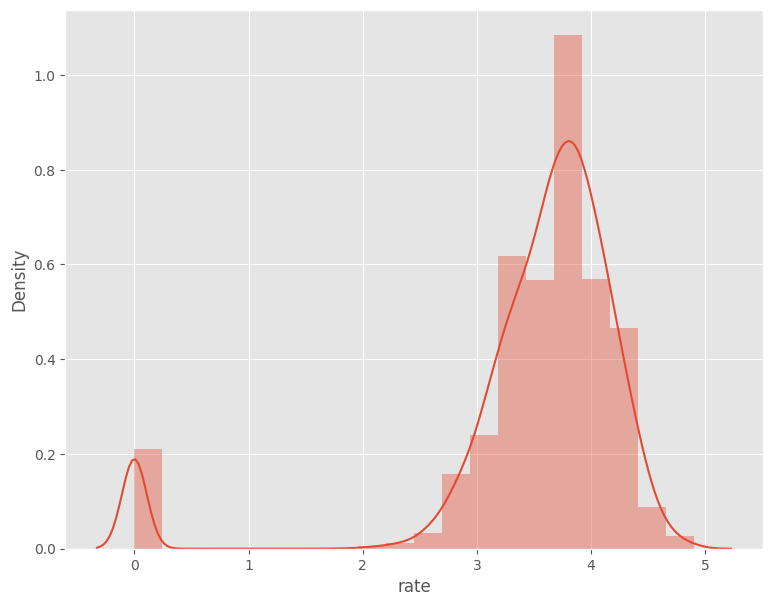

In [31]:
# How ratings are distributed
plt.figure(figsize=(9, 7))
sns.distplot(df['rate'], bins=20)

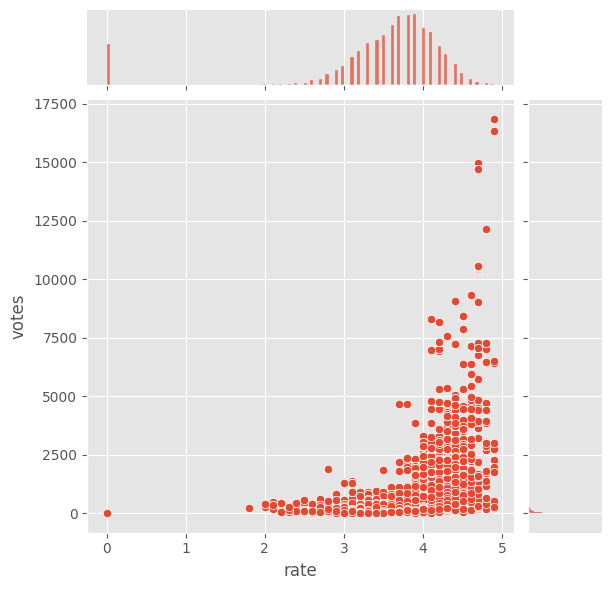

In [32]:
# Creates a joint plot using Seaborn (sns) to explore the relationship between 'rate' and 'votes' columns in the DataFrame df.
sns.jointplot(x='rate', y='votes', data=df)


In [33]:
def create_target(x):
    """
    Function to create a binary target variable based on conditions in the input DataFrame x.
    Returns 1 if 'rate' is greater than or equal to 3.7, or if 'votes' is greater than or equal to 3000; otherwise, returns 0.
    Returns 0 if 'rate' is NaN.

    Parameters:
    - x: Input DataFrame.

    Usage example:
    df['target'] = df.apply(create_target, axis=1)
    """
    if pd.notna(x['rate']):
        if x['rate'] >= 3.7:
            return 1
        else:
            return 0
    else:
        if x['votes'] >= 3000:
            return 1
        else:
            return 0


In [34]:
# Creates a new column 'target' based on the conditions defined in the create_target function.
df['rate'] = df.apply(create_target, axis=1)


In [35]:
# Counts the number of missing values (NaN) in the modified 'rate' column.
df['rate'].isna().sum()


0

In [36]:
df['rate'].unique()

array([1, 0], dtype=int64)

In [37]:
df['rate'].value_counts()

0    27652
1    24065
Name: rate, dtype: int64

In [38]:
px.histogram(data_frame=df , x='rate',text_auto=True,
             template='plotly_dark',color_discrete_sequence=px.colors.qualitative.Set3)

<Axes: xlabel='rate', ylabel='Density'>

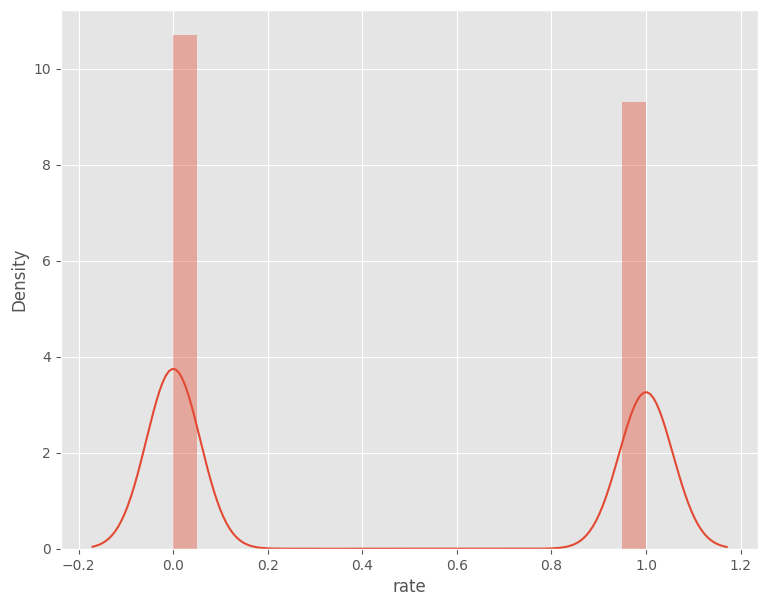

In [39]:
# How ratings are distributed
plt.figure(figsize=(9, 7))
sns.distplot(df['rate'], bins=20)

## Votes

In [40]:
df['votes'].unique()

array([ 775,  787,  918, ..., 4957, 2382,  843], dtype=int64)

In [41]:
# Converts the 'votes' column in the Pandas DataFrame df to numeric values, coercing errors to NaN and downcasting to integer.
df['votes'] = pd.to_numeric(df['votes'], errors='coerce', downcast='integer')

# Checks the data type of the 'votes' column after the conversion.
df['votes'].dtype


dtype('int16')

<Axes: ylabel='Density'>

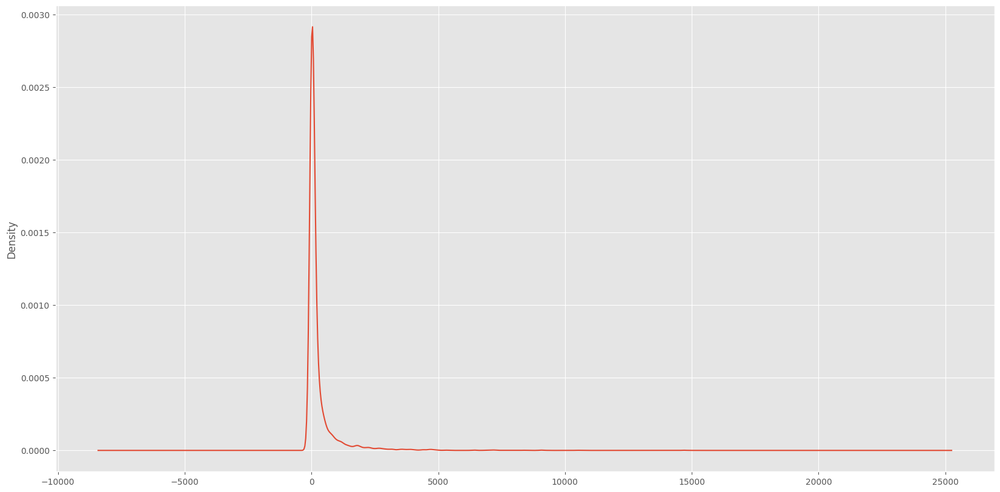

In [42]:
# Plots the kernel density estimate (KDE) for the 'votes' column in the Pandas DataFrame df.
df['votes'].plot(kind='kde', figsize=(20, 10))


In [43]:
df.drop('votes',inplace=True,axis=1)

In [44]:
df.duplicated().sum()

0

In [45]:
# Removes duplicate rows from the Pandas DataFrame df, resets the index, and modifies the DataFrame in place.
df.drop_duplicates(inplace=True)
df.reset_index(drop=True, inplace=True)


## phone

In [46]:
df['phone'].unique().tolist()

['080 42297555\r\n+91 9743772233',
 '080 41714161',
 '+91 9663487993',
 '+91 9620009302',
 '+91 8026612447\r\n+91 9901210005',
 '+91 9980040002\r\n+91 9980063005',
 '+91 9731716688\r\n080 26740366',
 '080 48653961\r\n080 48655715',
 '+91 8884135549\r\n+91 9449449316',
 '+91 9945230807\r\n+91 9743804471',
 '080 26724489\r\n+91 7406048982',
 '+91 9742166777',
 '+91 9731644212',
 '080 49577715',
 '080 26768182\r\n+91 9845704455',
 '+91 9972988038\r\n+91 9900121238',
 '080 26711554\r\n+91 9741406338',
 '+91 8884726600',
 '+91 9880594520',
 '+91 9880016665\r\n+91 8217311687',
 '+91 7406822844',
 '080 32486296',
 '080 65975430\r\n+91 7337733798',
 '+91 9901481185',
 '+91 8971090261',
 '+91 9945758046',
 '+91 9008628448',
 '+91 9591111123',
 '080 26600704\r\n+91 9342593424',
 '+91 9148421256',
 '+91 9916107070',
 '+91 7710055553',
 '+91 7738383000',
 '+91 7700020020',
 '+91 7022260661\r\n+91 7022260662',
 '+91 9742974232',
 '00 919663567711\r\n+91 9916326323',
 '080 49653266',
 '+91 901956348

## location

In [47]:
df['location'].unique().tolist()

['Banashankari',
 'Basavanagudi',
 'Mysore Road',
 'Jayanagar',
 'Kumaraswamy Layout',
 'Rajarajeshwari Nagar',
 'Vijay Nagar',
 'Uttarahalli',
 'JP Nagar',
 'South Bangalore',
 'City Market',
 'Nagarbhavi',
 'Bannerghatta Road',
 'BTM',
 'Kanakapura Road',
 'Bommanahalli',
 nan,
 'CV Raman Nagar',
 'Electronic City',
 'HSR',
 'Marathahalli',
 'Sarjapur Road',
 'Wilson Garden',
 'Shanti Nagar',
 'Koramangala 5th Block',
 'Koramangala 8th Block',
 'Richmond Road',
 'Koramangala 7th Block',
 'Jalahalli',
 'Koramangala 4th Block',
 'Bellandur',
 'Whitefield',
 'East Bangalore',
 'Old Airport Road',
 'Indiranagar',
 'Koramangala 1st Block',
 'Frazer Town',
 'RT Nagar',
 'MG Road',
 'Brigade Road',
 'Lavelle Road',
 'Church Street',
 'Ulsoor',
 'Residency Road',
 'Shivajinagar',
 'Infantry Road',
 'St. Marks Road',
 'Cunningham Road',
 'Race Course Road',
 'Commercial Street',
 'Vasanth Nagar',
 'HBR Layout',
 'Domlur',
 'Ejipura',
 'Jeevan Bhima Nagar',
 'Old Madras Road',
 'Malleshwaram',

In [48]:
df['location'].value_counts(dropna=False)

BTM                      5124
HSR                      2523
Koramangala 5th Block    2504
JP Nagar                 2235
Whitefield               2144
                         ... 
West Bangalore              6
Yelahanka                   6
Jakkur                      3
Rajarajeshwari Nagar        2
Peenya                      1
Name: location, Length: 94, dtype: int64

In [49]:
# Creates a DataFrame 'top_20_foodie_area' containing the top 20 most frequent occurrences of values in the 'location' column.
top_20_foodie_area = df['location'].value_counts(ascending=False)[:20].reset_index()
top_20_foodie_area.columns = ['location', 'count']
top_20_foodie_area


,location,count
0,BTM,5124
1,HSR,2523
2,Koramangala 5th Block,2504
3,JP Nagar,2235
4,Whitefield,2144
5,Indiranagar,2083
6,Jayanagar,1926
7,Marathahalli,1846
8,Bannerghatta Road,1630
9,Bellandur,1286


In [50]:
# Creates a horizontal bar plot using Plotly Express (px) to visualize the top 20 foodie areas in Bangalore.
px.bar(top_20_foodie_area, 
       y='location',
       x='count', 
       color='location',
       orientation='h',
       text_auto=True,
       title='Top 20 Foodie Areas in Bangalore',
       labels={'location': 'Restaurant Location', 'count': 'Count'},
       template='plotly_dark',
       color_discrete_sequence=px.colors.qualitative.Set2)


In [51]:
location= df['location'].value_counts()[:20]
labels = df['location'].value_counts()[:20].index.transpose()
location

BTM                      5124
HSR                      2523
Koramangala 5th Block    2504
JP Nagar                 2235
Whitefield               2144
Indiranagar              2083
Jayanagar                1926
Marathahalli             1846
Bannerghatta Road        1630
Bellandur                1286
Electronic City          1258
Koramangala 1st Block    1238
Brigade Road             1218
Koramangala 7th Block    1181
Koramangala 6th Block    1156
Sarjapur Road            1065
Ulsoor                   1023
Koramangala 4th Block    1017
MG Road                   918
Banashankari              906
Name: location, dtype: int64

In [52]:
px.pie(df, names=labels, title='location Distribution', labels=labels, values=location,
             template='plotly_dark',color_discrete_sequence=px.colors.qualitative.Set3)

## rest type

In [53]:
df['rest_type'].unique().tolist()

['Casual Dining',
 'Cafe, Casual Dining',
 'Quick Bites',
 'Casual Dining, Cafe',
 'Cafe',
 'Quick Bites, Cafe',
 'Cafe, Quick Bites',
 'Delivery',
 'Mess',
 'Dessert Parlor',
 'Bakery, Dessert Parlor',
 'Pub',
 'Bakery',
 'Takeaway, Delivery',
 'Fine Dining',
 'Beverage Shop',
 'Sweet Shop',
 'Bar',
 'Beverage Shop, Quick Bites',
 'Confectionery',
 'Quick Bites, Beverage Shop',
 'Dessert Parlor, Sweet Shop',
 'Bakery, Quick Bites',
 'Sweet Shop, Quick Bites',
 'Kiosk',
 'Food Truck',
 'Quick Bites, Dessert Parlor',
 'Beverage Shop, Dessert Parlor',
 'Takeaway',
 'Pub, Casual Dining',
 'Casual Dining, Bar',
 'Dessert Parlor, Beverage Shop',
 'Quick Bites, Bakery',
 'Dessert Parlor, Quick Bites',
 'Microbrewery, Casual Dining',
 'Lounge',
 'Bar, Casual Dining',
 'Food Court',
 'Cafe, Bakery',
 nan,
 'Dhaba',
 'Quick Bites, Sweet Shop',
 'Microbrewery',
 'Food Court, Quick Bites',
 'Pub, Bar',
 'Casual Dining, Pub',
 'Lounge, Bar',
 'Food Court, Dessert Parlor',
 'Casual Dining, Sweet Sh

In [54]:
df['rest_type'].value_counts(dropna=False)[:25]

Quick Bites                   19132
Casual Dining                 10330
Cafe                           3732
Delivery                       2604
Dessert Parlor                 2263
Takeaway, Delivery             2037
Casual Dining, Bar             1154
Bakery                         1141
Beverage Shop                   867
Bar                             697
Food Court                      624
Sweet Shop                      468
Bar, Casual Dining              425
Lounge                          396
Pub                             357
Fine Dining                     346
Casual Dining, Cafe             319
Beverage Shop, Quick Bites      298
Bakery, Quick Bites             289
Mess                            267
Pub, Casual Dining              255
NaN                             227
Sweet Shop, Quick Bites         178
Kiosk                           176
Dessert Parlor, Cafe            175
Name: rest_type, dtype: int64

In [55]:
df.reset_index(drop=True,inplace=True)

In [56]:
def handle_rest_type(x):
    """
    Function to extract the first restaurant type from a comma-separated string.
    Returns the first type if not NaN; otherwise, returns NaN.

    Parameters:
    - x: Input value containing comma-separated restaurant types.

    Usage example:
    df['rest_type'] = df['rest_type'].apply(handle_rest_type)
    """
    if pd.notna(x):
        return x.split(',')[0]
    else:
        return x


In [57]:
df['rest_type'] = df['rest_type'].apply(handle_rest_type)

In [58]:
# Creates a DataFrame 'top_20_rest_type' containing the top 20 most frequent occurrences of values in the 'rest_type' column.
top_20_rest_type = df['rest_type'].value_counts(ascending=False)[:20].reset_index()
top_20_rest_type.columns = ['rest_type', 'count']
top_20_rest_type


,rest_type,count
0,Quick Bites,19521
1,Casual Dining,12026
2,Cafe,4364
3,Dessert Parlor,2744
4,Delivery,2604
5,Takeaway,2157
6,Bakery,1689
7,Beverage Shop,1272
8,Bar,1155
9,Pub,776


In [59]:
px.histogram(data_frame=top_20_rest_type ,x='rest_type' , y='count',color="rest_type",
             text_auto=True,
             title='Top 20 rest type in Bangalore',
             labels={'rest_type': 'Restaurant rest type', 'count': 'Count'},
             template='plotly_dark',
             color_discrete_sequence=px.colors.qualitative.Set2)

In [60]:
rest_type= df['rest_type'].value_counts()[:10]
labels = df['rest_type'].value_counts()[:10].index.transpose()
rest_type

Quick Bites       19521
Casual Dining     12026
Cafe               4364
Dessert Parlor     2744
Delivery           2604
Takeaway           2157
Bakery             1689
Beverage Shop      1272
Bar                1155
Pub                 776
Name: rest_type, dtype: int64

In [61]:
px.pie(df, names=labels,title='location Distribution', labels=labels, values=rest_type, hole=0.4
       ,      template='plotly_dark',color_discrete_sequence=px.colors.qualitative.Set3)

In [62]:
df['rest_type'].isnull().sum()

227

## dish_liked

In [63]:
df['dish_liked'].unique().tolist()

['Pasta, Lunch Buffet, Masala Papad, Paneer Lajawab, Tomato Shorba, Dum Biryani, Sweet Corn Soup',
 'Momos, Lunch Buffet, Chocolate Nirvana, Thai Green Curry, Paneer Tikka, Dum Biryani, Chicken Biryani',
 'Churros, Cannelloni, Minestrone Soup, Hot Chocolate, Pink Sauce Pasta, Salsa, Veg Supreme Pizza',
 'Masala Dosa',
 'Panipuri, Gol Gappe',
 'Onion Rings, Pasta, Kadhai Paneer, Salads, Salad, Roti, Jeera Rice',
 nan,
 'Farmhouse Pizza, Chocolate Banana, Virgin Mojito, Pasta, Paneer Tikka, Lime Soda, Prawn Pizza',
 'Pizza, Mocktails, Coffee, Nachos, Salad, Pasta, Sandwiches',
 'Waffles, Pasta, Coleslaw Sandwich, Choco Waffle, Tacos, Momos, Cheese Nachos',
 'Waffles, Pasta, Crispy Chicken, Honey Chilli Chicken, Sandwich, Coffee, Crepe',
 'Mocktails, Peri Fries, Lasagne, Pizza, Chicken Bbq Wings, Virgin Mojito, Nachos',
 'Coffee, Spaghetti, Pancakes, Nachos, Pasta, Sandwich, Garlic Bread',
 'Sandwich, Omelette, Ice Tea, Virgin Mojito, Hot Chocolate, Pasta Arrabiata, Hazelnut Cappuccino',


## cuisines

In [64]:
df['cuisines'].unique().tolist()

['North Indian, Mughlai, Chinese',
 'Chinese, North Indian, Thai',
 'Cafe, Mexican, Italian',
 'South Indian, North Indian',
 'North Indian, Rajasthani',
 'North Indian',
 'North Indian, South Indian, Andhra, Chinese',
 'Pizza, Cafe, Italian',
 'Cafe, Italian, Continental',
 'Cafe, Mexican, Italian, Momos, Beverages',
 'Cafe',
 'Cafe, Chinese, Continental, Italian',
 'Cafe, Continental',
 'Cafe, Fast Food, Continental, Chinese, Momos',
 'Chinese, Cafe, Italian',
 'Cafe, Italian, American',
 'Cafe, French, North Indian',
 'Cafe, Pizza, Fast Food, Beverages',
 'Cafe, Fast Food',
 'Italian, Fast Food, Cafe, European',
 'Cafe, Bakery',
 'Cafe, South Indian',
 'Cafe, Fast Food, Beverages',
 'North Indian, Cafe, Chinese, Fast Food',
 'Cafe, Italian',
 'North Indian, Fast Food, Chinese, Burger',
 'Bakery, Desserts',
 'Pizza',
 'North Indian, Biryani, Fast Food',
 'Biryani',
 'North Indian, Chinese, Fast Food',
 'Chinese, Thai, Momos',
 'North Indian, Mughlai, South Indian, Chinese',
 'South I

In [65]:
def fix_cuisines(x):
    """
    Function to extract the first cuisine from a comma-separated string.
    Returns the first cuisine if not NaN; otherwise, returns NaN.

    Parameters:
    - x: Input value containing comma-separated cuisines.

    Usage example:
    df['cuisines'] = df['cuisines'].apply(fix_cuisines)
    """
    if pd.notna(x):
        return x.split(',')[0]
    else:
        return x


In [66]:
df['cuisines'] = df['cuisines'].apply(fix_cuisines)

In [67]:
len(df['cuisines'].unique())

89

In [68]:
df['cuisines'].unique().tolist()

['North Indian',
 'Chinese',
 'Cafe',
 'South Indian',
 'Pizza',
 'Italian',
 'Bakery',
 'Biryani',
 'Street Food',
 'Burger',
 'Fast Food',
 'Ice Cream',
 'Healthy Food',
 'Asian',
 'Desserts',
 'Goan',
 'Continental',
 'Seafood',
 'Beverages',
 'Mithai',
 'Sandwich',
 'Mangalorean',
 'Rolls',
 'Andhra',
 'Thai',
 'Salad',
 'Bengali',
 'Arabian',
 'BBQ',
 'Vietnamese',
 'Juices',
 'Mexican',
 'Tibetan',
 'Tea',
 'Momos',
 'Mughlai',
 nan,
 'Hyderabadi',
 'Finger Food',
 'Kebab',
 'American',
 'Kerala',
 'Oriya',
 'Maharashtrian',
 'Bohri',
 'African',
 'Rajasthani',
 'Turkish',
 'Tamil',
 'Roast Chicken',
 'Gujarati',
 'South American',
 'Konkan',
 'Drinks Only',
 'Awadhi',
 'European',
 'Lebanese',
 'Japanese',
 'Modern Indian',
 'Bihari',
 'Australian',
 'Mediterranean',
 'Chettinad',
 'Steak',
 'Spanish',
 'Portuguese',
 'Parsi',
 'Nepalese',
 'Burmese',
 'North Eastern',
 'Lucknowi',
 'Korean',
 'Malaysian',
 'Sushi',
 'Kashmiri',
 'French',
 'Assamese',
 'Coffee',
 'Charcoal Chic

## cost

In [69]:
df = df.rename(columns={'approx_cost(for two people)':'approx_cost'})
df.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'phone',
       'location', 'rest_type', 'dish_liked', 'cuisines', 'approx_cost',
       'reviews_list', 'menu_item', 'listed_in(type)', 'listed_in(city)'],
      dtype='object')

In [70]:
df['approx_cost'].unique()

array(['800', '300', '600', '700', '550', '500', '450', '650', '400',
       '900', '200', '750', '150', '850', '100', '1,200', '350', '250',
       '950', '1,000', '1,500', '1,300', '199', '80', '1,100', '160',
       '1,600', '230', '130', '50', '190', '1,700', nan, '1,400', '180',
       '1,350', '2,200', '2,000', '1,800', '1,900', '330', '2,500',
       '2,100', '3,000', '2,800', '3,400', '40', '1,250', '3,500',
       '4,000', '2,400', '2,600', '120', '1,450', '469', '70', '3,200',
       '60', '560', '240', '360', '6,000', '1,050', '2,300', '4,100',
       '5,000', '3,700', '1,650', '2,700', '4,500', '140'], dtype=object)

In [71]:
# Converts the 'approx_cost' column in the Pandas DataFrame df to string and removes commas from the values.
df['approx_cost'] = df['approx_cost'].apply(lambda x: str(x).replace(',', ''))


In [72]:
df['approx_cost'] = df['approx_cost'].astype(float)

In [73]:
df['approx_cost'].isna().sum()

346

In [74]:
df.dropna(subset=['approx_cost'], inplace=True)
df.reset_index(drop=True, inplace=True)

In [75]:
df

,url,address,name,online_order,book_table,rate,phone,location,rest_type,dish_liked,cuisines,approx_cost,reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,1,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...",North Indian,800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,1,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...",Chinese,800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,1,+91 9663487993,Banashankari,Cafe,"Churros, Cannelloni, Minestrone Soup, Hot Choc...",Cafe,800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,1,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,South Indian,300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,1,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe",North Indian,600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51366,https://www.zomato.com/bangalore/best-brews-fo...,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,0,080 40301477,Whitefield,Bar,NaN,Continental,1500.0,"[('Rated 5.0', ""RATED\n Food and service are ...",[],Pubs and bars,Whitefield
51367,https://www.zomato.com/bangalore/vinod-bar-and...,"Number 10, Garudachar Palya, Mahadevapura, Whi...",Vinod Bar And Restaurant,No,No,0,+91 8197675843,Whitefield,Bar,NaN,Finger Food,600.0,[],[],Pubs and bars,Whitefield
51368,https://www.zomato.com/bangalore/plunge-sherat...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,0,NaN,Whitefield,Bar,NaN,Finger Food,2000.0,[],[],Pubs and bars,Whitefield
51369,https://www.zomato.com/bangalore/chime-sherato...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,1,080 49652769,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500.0,"[('Rated 4.0', 'RATED\n Nice and friendly pla...",[],Pubs and bars,Whitefield


## reviews_list

In [76]:
df['reviews_list'].unique()

array(['[(\'Rated 4.0\', \'RATED\\n  A beautiful place to dine in.The interiors take you back to the Mughal era. The lightings are just perfect.We went there on the occasion of Christmas and so they had only limited items available. But the taste and service was not compromised at all.The only complaint is that the breads could have been better.Would surely like to come here again.\'), (\'Rated 4.0\', \'RATED\\n  I was here for dinner with my family on a weekday. The restaurant was completely empty. Ambience is good with some good old hindi music. Seating arrangement are good too. We ordered masala papad, panner and baby corn starters, lemon and corrionder soup, butter roti, olive and chilli paratha. Food was fresh and good, service is good too. Good for family hangout.\\nCheers\'), (\'Rated 2.0\', \'RATED\\n  Its a restaurant near to Banashankari BDA. Me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet. On inquiring they said th

## menu_item

In [77]:
df['menu_item'].unique().tolist()

['[]',
 "['Chocolate Fantasy (Pack Of 5)', 'Pan Cake (Pack Of 6)', 'Gulab Jamun (Pack Of 10)', 'Gulkand Shot (Pack Of 5)', 'Chocolate Decadence (Pack of 2)', 'CheeseCake (Pack Of 2)', 'Red Velvet Slice Cake (Pack of 2)', 'Red Velvet Slice Cake & Cheese Cake (Pack of 2)', 'Red Velvet Slice Cake & Chocolate Decadence Cake (Pack of 2)', 'Hazelnut Brownie (Pack of 2)', 'Moments', 'Red Velvet Cake With Butter Cream Frosting (750 Gm)', 'Red Velvet Slice Cake (Pack of 2)', 'Red Velvet Slice Cake & Cheese Cake (Pack of 2)', 'Red Velvet Slice Cake & Chocolate Decadence Cake (Pack of 2)', 'Red Velvet Slice Cake (Pack of 1)', 'Valentine Red Velvet Jar', 'Valentine Chocolate Jar', 'Valentines Jar Combo', 'Pink Guava 500 ML', 'Oreo Vanilla 500 ML', 'Cookie Crumble 500 ML', 'Chocolate Fantasy', 'Gulkand-E-Bahar', 'Pan Cake', 'Hazelnut Brownie (Pack Of 1)', 'Gulab Jamun (Pack Of 2)', 'Plum Cake', 'Red Velvet Cake With Butter Cream Frosting (750 Gm)', 'Chocolate Mud Cake (700 Gms)', 'CheeseCake (Pack 

## type

In [78]:
df = df.rename(columns={'listed_in(type)':'type'})
df.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'phone',
       'location', 'rest_type', 'dish_liked', 'cuisines', 'approx_cost',
       'reviews_list', 'menu_item', 'type', 'listed_in(city)'],
      dtype='object')

In [79]:
df['type'].unique()

array(['Buffet', 'Cafes', 'Delivery', 'Desserts', 'Dine-out',
       'Drinks & nightlife', 'Pubs and bars'], dtype=object)

In [80]:
df['type'] = df['type'].apply(lambda x: x.lower())

In [81]:
df['type'].unique()

array(['buffet', 'cafes', 'delivery', 'desserts', 'dine-out',
       'drinks & nightlife', 'pubs and bars'], dtype=object)

## city

In [82]:
df = df.rename(columns={'listed_in(city)':'city'})
df.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'phone',
       'location', 'rest_type', 'dish_liked', 'cuisines', 'approx_cost',
       'reviews_list', 'menu_item', 'type', 'city'],
      dtype='object')

In [83]:
df['city'].unique()

array(['Banashankari', 'Bannerghatta Road', 'Basavanagudi', 'Bellandur',
       'Brigade Road', 'Brookefield', 'BTM', 'Church Street',
       'Electronic City', 'Frazer Town', 'HSR', 'Indiranagar',
       'Jayanagar', 'JP Nagar', 'Kalyan Nagar', 'Kammanahalli',
       'Koramangala 4th Block', 'Koramangala 5th Block',
       'Koramangala 6th Block', 'Koramangala 7th Block', 'Lavelle Road',
       'Malleshwaram', 'Marathahalli', 'MG Road', 'New BEL Road',
       'Old Airport Road', 'Rajajinagar', 'Residency Road',
       'Sarjapur Road', 'Whitefield'], dtype=object)

# Question analysis

### What are the most popular Resturants offered by Bangalore resturants?

In [84]:
dff= pd.read_csv('zomato.csv')

In [85]:
popular_Resturants = dff.groupby("name")["votes"].sum().sort_values(ascending=False).head(10)

In [86]:
fig = px.histogram(data_frame=dff[dff['name'].isin(popular_Resturants.index)], x='name', y='votes',
                   title='Top 10 Popular Restaurants by Votes')
fig.show()

### What are top 10 expensive rest_types in average?

In [87]:
df.groupby("rest_type")["approx_cost"].mean().sort_values(ascending=False).head()

rest_type
Fine Dining     2750.370370
Club            2170.731707
Lounge          1728.243513
Microbrewery    1633.185841
Bar             1307.142857
Name: approx_cost, dtype: float64

### Which locations in Bangalore have the highest concentration of restaurants and draw the top 10?

In [88]:
# Creates a DataFrame 'dff_location' with the top 10 most frequent occurrences of values in the 'location' column.
# Constructs a bar plot using Plotly Express to visualize the distribution of locations in Bangalore.
# The x-axis represents the locations, and the y-axis represents the count of each location.
# The title of the plot is set to "Top 10 Locations in Bangalore."
dff_location = dff["location"].value_counts().head(10).reset_index()
dff_location.columns = ["location", "count"]

fig = px.bar(data_frame=dff_location, x="location", y="count",
                   title="Top 10 Locations in Bangalore")
fig.show()


### What is the distribution of restaurant rating in Bangalore?

In [89]:
dff['rate']=dff['rate'].apply(fix_rate)

In [90]:
dff['rate'] = pd.to_numeric(dff['rate'], errors='coerce',downcast='float')

<Axes: xlabel='rate', ylabel='Density'>

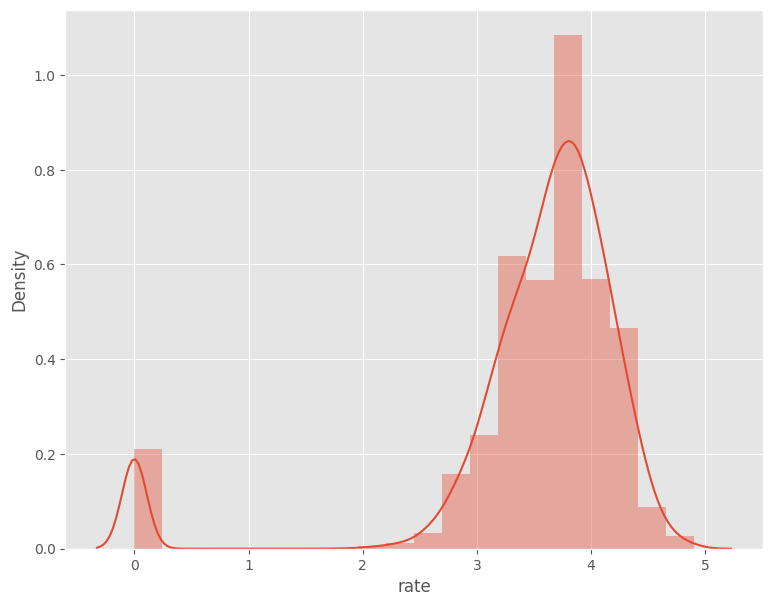

In [91]:
# How ratings are distributed
plt.figure(figsize=(9, 7))
sns.distplot(dff['rate'], bins=20)

### Are there any correlations between the number of votes a restaurant recives and its rating?

In [92]:
px.scatter(data_frame = dff , x="rate" , y="votes")

### Which restaurant types are most likely to offer online ordering and table booking?

In [93]:
dff_like = dff[(dff["online_order"] == "Yes") & (dff["book_table"] == "Yes")]["rest_type"].value_counts().head(10).reset_index()
dff_like.columns = ["rest_type", "count"]

fig = px.bar(data_frame=dff_like, x="rest_type", y="count",
                   title="Top 10 restaurants that offer online ordering and table booking")
fig.show()

### How do the average ratings differ for restaurants with and without online ordering?

In [94]:
# Groups the DataFrame 'dff' by the 'online_order' column and calculates the mean rating for each category.
# Creates a pie chart using Plotly Express to visualize the average rating based on online order availability.
# The 'names' parameter represents the categories, and the 'values' parameter represents the average rating.
# The title of the plot is set to "Average Rating by Online Order Availability."
dff_OnlineOrder = dff.groupby("online_order")["rate"].mean().reset_index()

fig = px.pie(
    data_frame=dff_OnlineOrder,
    names="online_order",
    values="rate",
    title="Average Rating by Online Order Availability"
)

fig.show()


# ------------------------------------------------------------------------------------

In [95]:
# Drops specified columns ('url', 'address', 'reviews_list', 'dish_liked', 'phone', 'menu_item', 'name')
# from the Pandas DataFrame 'df' along the specified axis (axis=1, meaning columns).
df.drop(['url', 'address', 'reviews_list', 'dish_liked', 'phone', 'menu_item', 'name'], axis=1, inplace=True)
df.head()


,online_order,book_table,rate,location,rest_type,cuisines,approx_cost,type,city
0,Yes,Yes,1,Banashankari,Casual Dining,North Indian,800.0,buffet,Banashankari
1,Yes,No,1,Banashankari,Casual Dining,Chinese,800.0,buffet,Banashankari
2,Yes,No,1,Banashankari,Cafe,Cafe,800.0,buffet,Banashankari
3,No,No,1,Banashankari,Quick Bites,South Indian,300.0,buffet,Banashankari
4,No,No,1,Basavanagudi,Casual Dining,North Indian,600.0,buffet,Banashankari


In [96]:
# Drops rows with missing values in the specified columns ('location', 'rest_type', 'cuisines') from the Pandas DataFrame 'df'.
# Resets the index of the DataFrame and modifies it in place.
df.dropna(subset=['location','rest_type','cuisines'] , inplace=True)
df.reset_index(drop=True,inplace=True)

In [97]:
df.isna().sum()

online_order    0
book_table      0
rate            0
location        0
rest_type       0
cuisines        0
approx_cost     0
type            0
city            0
dtype: int64

In [98]:
df.duplicated().sum()

7344

In [99]:
df.drop_duplicates(inplace=True)

In [100]:
df.reset_index(drop=True,inplace=True)

In [101]:
df.columns

Index(['online_order', 'book_table', 'rate', 'location', 'rest_type',
       'cuisines', 'approx_cost', 'type', 'city'],
      dtype='object')

In [102]:
summary(df)

data shape: (43804, 9)


,data type,#missing,%missing,#unique,min,max,mean,first value,second value
online_order,object,0,0.0,2,NaN,NaN,NaN,Yes,Yes
book_table,object,0,0.0,2,NaN,NaN,NaN,Yes,No
rate,int64,0,0.0,2,0.0,1.0,0.49427,1,1
location,object,0,0.0,93,NaN,NaN,NaN,Banashankari,Banashankari
rest_type,object,0,0.0,23,NaN,NaN,NaN,Casual Dining,Casual Dining
cuisines,object,0,0.0,87,NaN,NaN,NaN,North Indian,Chinese
approx_cost,float64,0,0.0,70,40.0,6000.0,583.234979,800.0,800.0
type,object,0,0.0,7,NaN,NaN,NaN,buffet,buffet
city,object,0,0.0,30,NaN,NaN,NaN,Banashankari,Banashankari


In [103]:
df

,online_order,book_table,rate,location,rest_type,cuisines,approx_cost,type,city
0,Yes,Yes,1,Banashankari,Casual Dining,North Indian,800.0,buffet,Banashankari
1,Yes,No,1,Banashankari,Casual Dining,Chinese,800.0,buffet,Banashankari
2,Yes,No,1,Banashankari,Cafe,Cafe,800.0,buffet,Banashankari
3,No,No,1,Banashankari,Quick Bites,South Indian,300.0,buffet,Banashankari
4,No,No,1,Basavanagudi,Casual Dining,North Indian,600.0,buffet,Banashankari
...,...,...,...,...,...,...,...,...,...
43799,No,No,0,Whitefield,Bar,Continental,1500.0,pubs and bars,Whitefield
43800,No,No,0,Whitefield,Bar,Finger Food,600.0,pubs and bars,Whitefield
43801,No,No,0,Whitefield,Bar,Finger Food,2000.0,pubs and bars,Whitefield
43802,No,Yes,1,"ITPL Main Road, Whitefield",Bar,Finger Food,2500.0,pubs and bars,Whitefield


In [104]:
df.to_csv('Zomato_after_analysis.csv',index_label=False)

In [105]:
# Importing necessary libraries for data preprocessing, modeling, and evaluation in machine learning.

# Data Preprocessing
from sklearn.preprocessing import OneHotEncoder , RobustScaler ,LabelEncoder,MinMaxScaler,StandardScaler
from category_encoders import BinaryEncoder
from sklearn.compose import ColumnTransformer

# Modeling
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_validate,GridSearchCV ,RandomizedSearchCV
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC 
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# Model Evaluation and Metrics
from sklearn.metrics import r2_score,confusion_matrix,recall_score,precision_score,f1_score,fbeta_score,accuracy_score

# Other
from scipy.stats import randint


In [106]:
# Creating a ColumnTransformer named 'Encoder' to apply transformations to specific columns.

# Applying BinaryEncoder to encode categorical columns.
# Columns: ['online_order', 'book_table', 'location', 'rest_type', 'cuisines', 'type', 'city']
Encoder = ColumnTransformer(
    transformers=[
        ("BinaryEncoder", BinaryEncoder(), ['online_order', 'book_table', 'location', 'rest_type', 'cuisines', 'type', 'city'])
    ],
    remainder="passthrough"
)


In [107]:
# Splitting the DataFrame into feature variables (x) and the target variable (y).

# Features (x) exclude the 'rate' column.
x = df.drop('rate', axis=1)

# Target variable (y) is the 'rate' column.
y = df['rate']


In [108]:
# Initialize a list of machine learning models for classification.
models = []

# Add models to the list along with their abbreviated names and corresponding model objects.
models.append(("LR", LogisticRegression()))  # Logistic Regression
models.append(("CART", DecisionTreeClassifier()))  # Decision Tree Classifier
models.append(("XG", XGBClassifier()))  # XGBoost Classifier
models.append(("KN",KNeighborsClassifier())) # k-Nearest Neighbors Classifier
models.append(("RF",RandomForestClassifier())) # Random Forest Classifier

In [109]:
# Looping through each machine learning model, applying preprocessing steps, and evaluating performance.

for model in models:
    # Create a list of steps in the pipeline.
    steps = []
    steps.append(("Encoder", Encoder))         # Apply the ColumnTransformer 'Encoder' for categorical encoding.
    steps.append(("Scaler", RobustScaler()))   # Apply RobustScaler for feature scaling.
    steps.append(model)                        # Add the current machine learning model.
    
    # Create a pipeline with the specified steps.
    pipeline = Pipeline(steps=steps)
    
    # Perform cross-validated scoring for the pipeline.
    scores = cross_validate(pipeline, x, y, cv=5, scoring="accuracy", return_train_score=True)
    
    # Print the model name and corresponding training and testing accuracy.
    print(model[0])
    print("Train_accuracy", scores["train_score"].mean())
    print("-" * 10)
    print("Test_accuracy", scores["test_score"].mean())
    print("-" * 20)
    print("\n")


LR
Train_accuracy 0.7038569595598145
----------
Test_accuracy 0.6929966137807708
--------------------


CART
Train_accuracy 0.9472308635589137
----------
Test_accuracy 0.8031691248940014
--------------------


XG
Train_accuracy 0.8273845018615136
----------
Test_accuracy 0.7436545238106407
--------------------


KN
Train_accuracy 0.8466578873927887
----------
Test_accuracy 0.7702727269410563
--------------------


RF
Train_accuracy 0.9472308635589137
----------
Test_accuracy 0.8124606118127297
--------------------




In [110]:
# Create a machine learning pipeline with data preprocessing (StandardScaler) and a RandomForestClassifier model.
steps = []  # Initialize a list to store the steps in the pipeline.
steps.append(("Encoder" , Encoder))
# Add data preprocessing step: Scaling features using RobustScaler.
steps.append(("Scaler", RobustScaler()))

# Add the machine learning model: RandomForestClassifier.
steps.append(('Model', RandomForestClassifier()))

# Create the pipeline by specifying the steps.
pipeline = Pipeline(steps=steps)


In [111]:
pipeline

Pipeline(steps=[('Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('BinaryEncoder',
                                                  BinaryEncoder(),
                                                  ['online_order', 'book_table',
                                                   'location', 'rest_type',
                                                   'cuisines', 'type',
                                                   'city'])])),
                ('Scaler', RobustScaler()),
                ('Model', RandomForestClassifier())])

# GridSearchCV

In [112]:
# Dictionary containing hyperparameter values for grid search.

params = {
    'Model__max_depth': [21, 23, 25],
    'Model__n_estimators': [218, 220]
}


In [113]:
# Creating a GridSearchCV object for hyperparameter tuning.

grid = GridSearchCV(
    estimator=pipeline,
    param_grid=params,
    cv=5,
    return_train_score=True,
    scoring="accuracy"
)


In [114]:
grid.fit(x,y)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('Encoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('BinaryEncoder',
                                                                         BinaryEncoder(),
                                                                         ['online_order',
                                                                          'book_table',
                                                                          'location',
                                                                          'rest_type',
                                                                          'cuisines',
                                                                          'type',
                                                                          'city'])])),
                                       ('Scaler', RobustScaler()),
                                       ('Model', RandomForestClassifier())]),
             param_grid={'Model__max_depth': [21, 23, 25],
                         'Model__n_estimators': [218, 220]},
             return_train_score=True, scoring='accuracy')

In [115]:
# Retrieving and printing the best parameters and score from the GridSearchCV results.

best_params = grid.best_params_
best_score = grid.best_score_

# Print or use the best parameters and score as needed
print("Best Parameters:", best_params)
print("-" * 100)
train_scores = grid.cv_results_["mean_train_score"].max()
test_scores = grid.cv_results_["mean_test_score"].max()
print(f"Train Accuracy={train_scores}, Test Accuracy={test_scores}")


Best Parameters: {'Model__max_depth': 25, 'Model__n_estimators': 218}
----------------------------------------------------------------------------------------------------
Train Accuracy=0.9472308635589137, Test Accuracy=0.8132596412390111


In [116]:
steps = []  # Initialize a list to store the steps in the pipeline.
steps.append(("Encoder" , Encoder))
# Add data preprocessing step: Scaling features using StandardScaler.
steps.append(("Scaler", RobustScaler()))


# Add the machine learning model: Decision Tree Classifier.
steps.append(('Model', RandomForestClassifier(max_depth =  23, n_estimators = 218)))

# Create the pipeline by specifying the steps.
pipeline = Pipeline(steps=steps)

In [117]:
pipeline.fit(x, y)

Pipeline(steps=[('Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('BinaryEncoder',
                                                  BinaryEncoder(),
                                                  ['online_order', 'book_table',
                                                   'location', 'rest_type',
                                                   'cuisines', 'type',
                                                   'city'])])),
                ('Scaler', RobustScaler()),
                ('Model',
                 RandomForestClassifier(max_depth=23, n_estimators=218))])

In [118]:
# Extracting unique values and sorting them for categorical columns.

location = sorted(df['location'].unique())
rest_type = sorted(df['rest_type'].unique())
cuisines = sorted(df['cuisines'].unique())
type1 = sorted(df['type'].unique())
city = sorted(df['city'].unique())


In [125]:
# Save the trained machine learning pipeline to a file named 'model.pkl'.
joblib.dump(pipeline, 'model.pkl', compress= 'xz')
# Save the feature column names to a file named 'inputs.pkl'.
joblib.dump(x.columns, 'inputs.pkl')

joblib.dump(location, 'location.pkl')
joblib.dump(rest_type, 'rest_type.pkl')
joblib.dump(cuisines, 'cuisines.pkl')
joblib.dump(type1, 'type1.pkl')
joblib.dump(city, 'city.pkl')

['city.pkl']

In [126]:
%%writefile test.py

import streamlit as st
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
import joblib

columns = joblib.load('inputs.pkl')
model = joblib.load('model.pkl')
location_values = joblib.load('location.pkl')
rest_type_values = joblib.load('rest_type.pkl')
cuisines_values = joblib.load('cuisines.pkl')
type_values = joblib.load('type1.pkl')
city_values = joblib.load('city.pkl')

def prediction(online_order, book_table, location, rest_type, cuisines, avg_cost, typee, city):
    df = pd.DataFrame(columns=columns)
    df.at[0,'online_order'] = online_order
    df.at[0,'book_table'] = book_table
    df.at[0,'location'] = location
    df.at[0,'rest_type'] = rest_type 
    df.at[0,'cuisines'] = cuisines 
    df.at[0,'approx_cost'] = avg_cost
    df.at[0,'type'] = typee
    df.at[0,'city'] = city


    res = model.predict(df)
    return res[0]
    
    


def main():
    st.title('Zomato Bangalore Restaurants :fork_and_knife:')
    online_order = st.selectbox('Has online order ?', ['Yes', 'No'])
    book_table = st.selectbox('Prebooking ?', ['Yes', 'No'])
    location = st.selectbox('Location:', location_values)
    
    
    rest_type = st.selectbox('Restaurant type:', rest_type_values)
    cuisines = st.selectbox('Cuisines:', cuisines_values)
    
    avg_cost = st.slider("Approximate cost for two persons:", min_value=30, max_value=7000, step = 1, value = 600 )
    typee = st.selectbox('Another restaurant type:', type_values)
    city = st.selectbox('City:', city_values)
    
   # Display user inputs
    st.write("^-^ User Inputs:")
    st.write(f"Online Order: {online_order}")
    st.write(f"Book Table: {book_table}")
    st.write(f"Location: {location}")
    st.write(f"Rest Type: {rest_type}")
    st.write(f"Cuisines: {cuisines}")
    st.write(f"Approximate Cost: {avg_cost}")
    st.write(f"Type: {typee}")
    st.write(f"City: {city}")
    
    if st.button(":star2:Predict:star2:"):
        
        result = prediction(online_order, book_table, location, rest_type, cuisines, avg_cost, typee, city)
        st.text(f"The expected poits this player could score is : {result}")

main()

Overwriting test.py
